# NAME: SINGH ARJITA
# PROJECT TITLE: AUTOMATED CELL COUNTING

## APPROACH 1: EXTRACTING PIXELS


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import models, layers
import tensorflow as tf
import cv2
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten
import numpy as np
import PIL
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import glob
from tqdm import tqdm

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/archive (6).zip'

extracted_folder = 'extracted'

os.makedirs(extracted_folder, exist_ok=True)

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder)

print(f'Files extracted to: {extracted_folder}')


Files extracted to: extracted


In [ ]:
image_folder = os.path.join(extracted_folder, 'images')
for filename in os.listdir(image_folder):
    if filename.endswith('.png'):
        image_path = os.path.join(image_folder, filename)
        img = cv2.imread(image_path,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # plt.imshow(img)
        # plt.axis('off')
        # plt.show()

In [ ]:
csv_file_path = os.path.join(extracted_folder, 'annotations.csv')
data = pd.read_csv(csv_file_path)
annotations_df=pd.DataFrame(data)
print(annotations_df)

              image        xmin        ymin        xmax        ymax label
0     image-100.png    0.000000    0.000000   25.190198   40.816803   rbc
1     image-100.png   15.010502    0.000000   68.337223   23.527421   rbc
2     image-100.png   25.017503   16.021004   78.374562   73.735123   rbc
3     image-100.png   75.565928    1.061844  140.248541   45.591599   rbc
4     image-100.png   77.483081   23.290548  131.936989   74.806301   rbc
...             ...         ...         ...         ...         ...   ...
2335   image-69.png  227.765502  207.710259  256.000000  248.054115   rbc
2336   image-69.png  201.832018  211.930101  251.736189  256.000000   rbc
2337   image-69.png   81.188275  231.883878  130.855693  254.391206   rbc
2338   image-69.png   35.903044  244.555806   79.863585  255.066516   rbc
2339   image-69.png  176.896280  244.360767  215.302142  255.741826   rbc

[2340 rows x 6 columns]


In [ ]:
print(annotations_df["label"].value_counts())

rbc    2237
wbc     103
Name: label, dtype: int64


In [ ]:
# Rectifying the mislabelings in the dataset by mere visualization
annotations_df.iloc[93,5]='rbc'
annotations_df.iloc[94,5]='rbc'
annotations_df.iloc[90,5]='wbc'
annotations_df.iloc[21,5]='rbc'
annotations_df.iloc[374,5]='rbc'
annotations_df.sort_values(by='image', inplace=True)

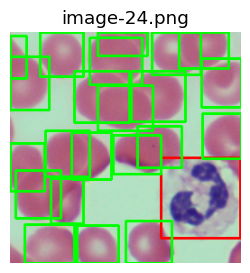

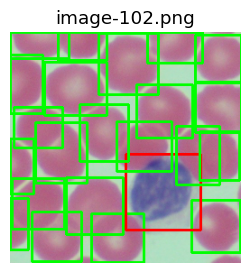

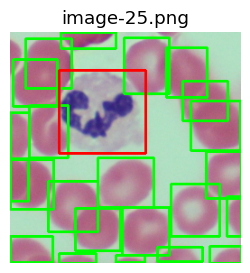

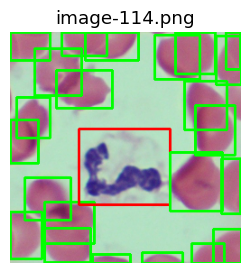

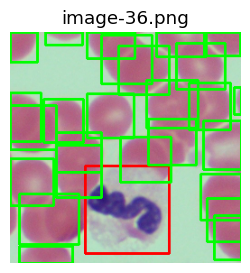

...

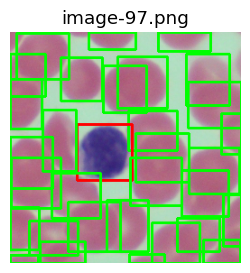

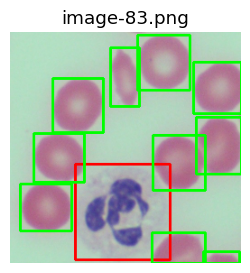

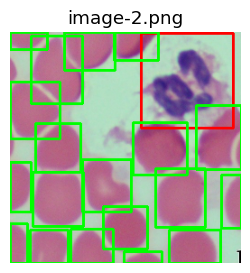

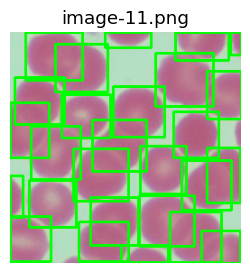

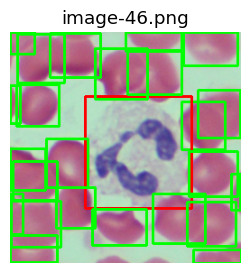

In [ ]:
for filename in os.listdir(image_folder):
    if filename.endswith('.png'):
        image_path = os.path.join(image_folder, filename)
        img = cv2.imread(image_path)

        annotations = annotations_df[annotations_df['image'] == filename]
        i=1

        for _, row in annotations.iterrows():
            xmin, ymin, xmax, ymax = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
            if row["label"] == 'wbc':
                color = (0, 0, 255)  # Red color for 'wbc'
            else:
                color = (0, 255, 0)  # Green color for 'rbc'

            cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color, 2)

        # Display the image with bounding boxes
        plt.figure(figsize=(3, 3))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(row["image"])
        plt.axis('off')
        plt.show()

Image Data Type: float32
Image Min Value: 0.101960786
Image Max Value: 1.0


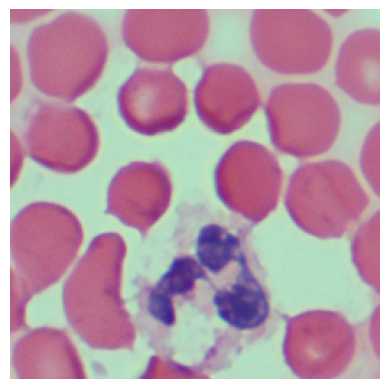

In [ ]:
import matplotlib.image as mpimg
img = mpimg.imread('/content/extracted/images/image-1.png')

print("Image Data Type:", img.dtype)
print("Image Min Value:", np.min(img))
print("Image Max Value:", np.max(img))

plt.imshow(img[::-1])
plt.axis('off')
plt.show()

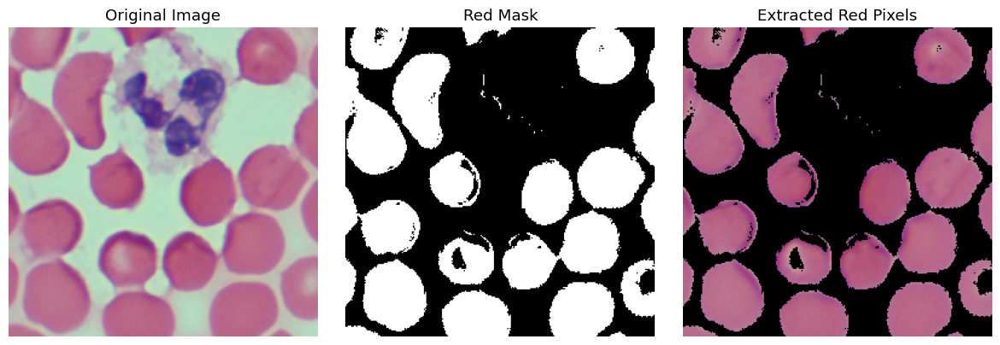

In [ ]:
# FOR RBCs
import cv2
import numpy as np
import matplotlib.pyplot as plt
if img.shape[2] == 4:
    img = img[:, :, :3]

# Defining lower and upper bounds for red color in RGB format (0 to 1 range)
lower_red = np.array([0.60, 0.0, 0.0])
upper_red = np.array([1.0, 0.61, 0.61])

# Thresholding the image to get a binary mask of red pixels
red_mask = np.all((img >= lower_red) & (img <= upper_red), axis=-1)

# Bitwise-AND the original image and the mask to extract red pixels
red_pixels = np.copy(img)
red_pixels[~red_mask] = 0
plt.figure(figsize=(12, 4))

# Original Image
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')

# Red Mask
plt.subplot(1, 3, 2)
plt.imshow(red_mask, cmap='gray')
plt.title("Red Mask")
plt.axis('off')

# Extracted Red Pixels
plt.subplot(1, 3, 3)
plt.imshow(red_pixels)
plt.title("Extracted Red Pixels")
plt.axis('off')

plt.tight_layout()
plt.show()

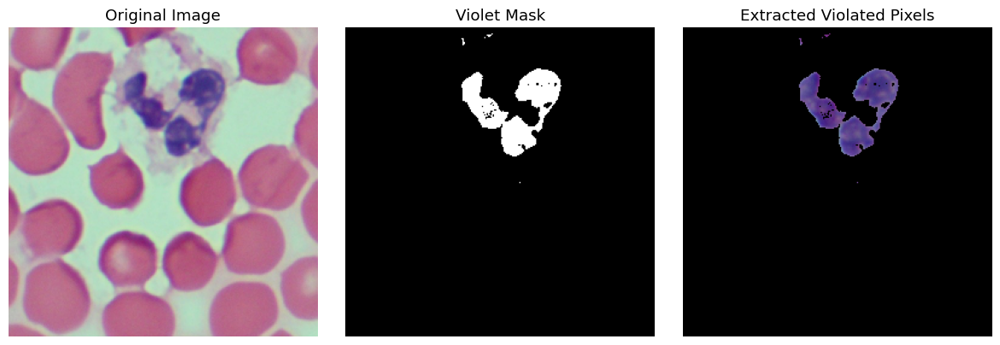

In [ ]:
# FOR WBCs
if img.shape[2] == 4:
    img = img[:, :, :3]

# Defining lower and upper bounds for violet color in RGB format (0 to 1 range)
lower_violet = np.array([0.0, 0.0, 0.5])
upper_violet = np.array([0.5, 0.61, 1])

# Threshold the image to get a binary mask of violet pixels
violet_mask = np.all((img >= lower_violet) & (img <= upper_violet), axis=-1)

# Bitwise-AND the original image and the mask to extract violet pixels
violet_pixels = np.copy(img)
violet_pixels[~violet_mask] = 0
plt.figure(figsize=(12, 4))

# Original Image
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')

# Violet Mask
plt.subplot(1, 3, 2)
plt.imshow(violet_mask, cmap='gray')
plt.title("Violet Mask")
plt.axis('off')

# Extracted Violet Pixels
plt.subplot(1, 3, 3)
plt.imshow(violet_pixels)
plt.title("Extracted Violated Pixels")
plt.axis('off')

plt.tight_layout()
plt.show()


Total number of cells in the image:  19
No. Of RBC's in the image is :  18
No. Of WBC's in the image is :  1


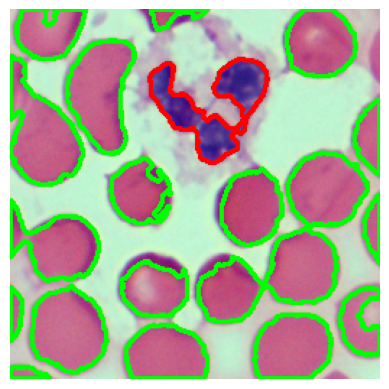

In [ ]:
import math
import cv2
import numpy as np
import matplotlib.pyplot as plt

red_mask1 = np.uint8(red_mask)
violet_mask1 = np.uint8(violet_mask)

# Morphological operations for red mask
kernel_red = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
opening_red = cv2.morphologyEx(red_mask1, cv2.MORPH_OPEN, kernel_red, iterations=1)
close_red = cv2.morphologyEx(opening_red, cv2.MORPH_CLOSE, kernel_red, iterations=2)

# Morphological operations for violet mask
kernel_violet = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
opening_violet = cv2.morphologyEx(violet_mask1, cv2.MORPH_OPEN, kernel_violet, iterations=1)
close_violet = cv2.morphologyEx(opening_violet, cv2.MORPH_CLOSE, kernel_violet, iterations=2)

# Detecting red cells using contour analysis
red_cnts = cv2.findContours(close_red, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
red_cnts = red_cnts[0] if len(red_cnts) == 2 else red_cnts[1]

# Detecting violet cells using contour analysis
violet_cnts = cv2.findContours(close_violet, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
violet_cnts = violet_cnts[0] if len(violet_cnts) == 2 else violet_cnts[1]

# Setting parameters for cell detection
minimum_area = 100
average_cell_area = 500
connected_cell_area = 6000

# cell counters
cells_total = 0
cells_red = 0
cells_violet = 0

# Normalizing the original image
normalized_img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)

# Drawing red cell contours on the normalized image
for c in red_cnts:
    area = cv2.contourArea(c)
    if area > minimum_area:
        cv2.drawContours(normalized_img, [c], -1, (0, 255, 0), 2)
        if area > connected_cell_area:
            cells_red += math.ceil(area / average_cell_area)
        else:
            cells_red += 1
        cells_total += 1

# Drawing violet cell contours on the normalized image
for c in violet_cnts:
    area = cv2.contourArea(c)
    if area > minimum_area:
        cv2.drawContours(normalized_img, [c], -1, (255, 0, 0), 2)
        if area > connected_cell_area:
            cells_violet += math.ceil(area / average_cell_area)
        else:
            cells_violet += 1
        cells_total += 1

# Displaying the image with combined cell contours
print("Total number of cells in the image: ", cells_total)
print("No. Of RBC's in the image is : ", cells_red)
print("No. Of WBC's in the image is : ", cells_violet)
plt.imshow(normalized_img)
plt.axis('off')
plt.show()

Encountered problem is that for some images the lobes of WBCs are so well defined that they are counted as individual cell, therefore overestimating their number

# APPROACH 2: HOUGH CIRCULAR TRANSFORM (WBC)

No Of WBC's in the image is:  1


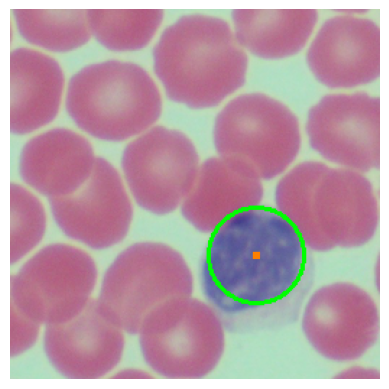

In [ ]:
display = cv2.imread("/content/extracted/images/image-102.png")

gray_image = cv2.cvtColor(display, cv2.COLOR_BGR2GRAY)
# # hough transform with modified circular parameters
Cell_count, x_count, y_count = [], [], []
circles = cv2.HoughCircles(gray_image,cv2.HOUGH_GRADIENT,20,1000,param1=80,param2=20,minRadius=3,maxRadius=45)

# # circle detection and labeling using hough transformation
if circles is not None:
  circles = np.round(circles[0, :]).astype("int")
  for (x, y, r) in circles:
    cv2.circle(display, (x, y), r, (0, 255, 0), 2)
    cv2.rectangle(display, (x - 2, y - 2), (x + 2, y + 2), (0, 128, 255), -1)
    Cell_count.append(r)
    x_count.append(x)
    y_count.append(y)

print("No Of WBC's in the image is: ",len(Cell_count))
plt.imshow(display[:,:,2::-1])
plt.axis('off')
plt.show()

Encountered problem is that for different images the parameter values of HCT are different. Therefore, we will have to fine tune the parameters

# APPROACH 3: YOLOV5

In [ ]:
import os
import zipfile
from tqdm import tqdm
import glob

import numpy as np
import pandas as pd
import PIL
import cv2

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

import tensorflow as tf
from tensorflow.keras import models, layers
from keras import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten


zip_file_path = '/content/drive/MyDrive/archive (6).zip'

extracted_folder = 'extracted'

os.makedirs(extracted_folder, exist_ok=True)

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder)

print(f'Files extracted to: {extracted_folder}')

csv_file_path = os.path.join(extracted_folder, 'annotations.csv')
data = pd.read_csv(csv_file_path)
annotations_df=pd.DataFrame(data)
print(annotations_df)

annotations_df.head()


Files extracted to: extracted
              image        xmin        ymin        xmax        ymax label
0     image-100.png    0.000000    0.000000   25.190198   40.816803   rbc
1     image-100.png   15.010502    0.000000   68.337223   23.527421   rbc
2     image-100.png   25.017503   16.021004   78.374562   73.735123   rbc
3     image-100.png   75.565928    1.061844  140.248541   45.591599   rbc
4     image-100.png   77.483081   23.290548  131.936989   74.806301   rbc
...             ...         ...         ...         ...         ...   ...
2335   image-69.png  227.765502  207.710259  256.000000  248.054115   rbc
2336   image-69.png  201.832018  211.930101  251.736189  256.000000   rbc
2337   image-69.png   81.188275  231.883878  130.855693  254.391206   rbc
2338   image-69.png   35.903044  244.555806   79.863585  255.066516   rbc
2339   image-69.png  176.896280  244.360767  215.302142  255.741826   rbc

[2340 rows x 6 columns]


,image,xmin,ymin,xmax,ymax,label
0,image-100.png,0.000000,0.000000,25.190198,40.816803,rbc
1,image-100.png,15.010502,0.000000,68.337223,23.527421,rbc
2,image-100.png,25.017503,16.021004,78.374562,73.735123,rbc
3,image-100.png,75.565928,1.061844,140.248541,45.591599,rbc
4,image-100.png,77.483081,23.290548,131.936989,74.806301,rbc


In [ ]:
unique_images = annotations_df['image'].unique()
train_images, test_images = unique_images[:85], unique_images[85:]

In [ ]:
cells_id = {
    'rbc': 0,
    'wbc': 1
}

cells_classes = list(cells_id.keys())
cells_classes

['rbc', 'wbc']

In [ ]:
yolo_train_dir = "yolo/train"
yolo_test_dir = "yolo/test"

for directory in [yolo_train_dir, yolo_test_dir]:
    for sub_dir in ["images", "labels"]:
        os.makedirs(os.path.join(directory, sub_dir), exist_ok=True)

In [ ]:
for image in train_images:
    lables_file = os.path.join(yolo_train_dir, 'labels', image.replace(".png", ".txt"))
    with open(lables_file, "w") as wobj:
        for box in annotations_df.loc[annotations_df.image == image].values:
            wobj.write("%d %f %f %f %f \n" % (
                cells_id[box[5]],
                ((box[3]+box[1])/2.0) / 256,
                ((box[4]+box[2])/2.0) / 256,
                (box[3]-box[1]) / 256,
                (box[4]-box[2]) / 256
            ))

for image in test_images:
    lables_file = os.path.join(yolo_test_dir, 'labels', image.replace(".png", ".txt"))
    with open(lables_file, "w") as wobj:
        for box in annotations_df.loc[annotations_df.image == image].values:
            wobj.write("%d %f %f %f %f \n" % (
                cells_id[box[5]],
                ((box[3]+box[1])/2.0) / 256,
                ((box[4]+box[2])/2.0) / 256,
                (box[3]-box[1]) / 256,
                (box[4]-box[2]) / 256
            ))

In [ ]:
size_new = (640, 640)

def replacement(src_file, dst_file, size=size_new):
    image = cv2.imread(src_file)
    image = cv2.resize(image, size)
    cv2.imwrite(dst_file, image)

In [ ]:
train_images_dir = "/content/extracted/images"

for image in train_images:
    src_file = os.path.join(train_images_dir , image)
    dst_file = os.path.join(yolo_train_dir, 'images', image)
    replacement(src_file, dst_file)

for image in test_images:
    src_file = os.path.join(train_images_dir , image)
    dst_file = os.path.join(yolo_test_dir, 'images', image)
    replacement(src_file, dst_file)

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -r requirements.txt
%cd -

Cloning into 'yolov5'...
remote: Enumerating objects: 16057, done.
remote: Total 16057 (delta 0), reused 0 (delta 0), pack-reused 16057
Receiving objects: 100% (16057/16057), 14.66 MiB | 17.89 MiB/s, done.
Resolving deltas: 100% (11028/11028), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 56.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.2/645.2 kB 52.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.3 MB/s eta 0:00:00
  Attempting uninstall: Pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.1.0 which is 

/content


In [ ]:
!cat yolov5/data/coco128.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license
# COCO128 dataset https://www.kaggle.com/ultralytics/coco128 (first 128 images from COCO train2017) by Ultralytics
# Example usage: python train.py --data coco128.yaml
# parent
# ├── yolov5
# └── datasets
#     └── coco128  ← downloads here (7 MB)


# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: ../datasets/coco128  # dataset root dir
train: images/train2017  # train images (relative to 'path') 128 images
val: images/train2017  # val images (relative to 'path') 128 images
test:  # test images (optional)

# Classes
names:
  0: person
  1: bicycle
  2: car
  3: motorcycle
  4: airplane
  5: bus
  6: train
  7: truck
  8: boat
  9: traffic light
  10: fire hydrant
  11: stop sign
  12: parking meter
  13: bench
  14: bird
  15: cat
  16: dog
  17: horse
  18: sheep
  19: cow
  20: elephant
  21: bear
  22: zebra
  23: giraffe
  24: backpack
  25: umbrella
  26: handb

In [ ]:
!pip install wandb
import wandb
wandb.login()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.9/243.9 kB 11.0 MB/s eta 0:00:00


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
yaml_file="yolov5/data/approach3.yaml"
train_directory = os.path.join("..", yolo_train_dir, "images")
val_directory = os.path.join("..", yolo_test_dir, "images")


names_str=""
for item in cells_classes:
    names_str=names_str + ", \'%s\'"%item
names_str= "names: ["+names_str[1:]+"]"

with open(yaml_file, "w") as wobj:
    wobj.write("train: %s\n"%train_directory)
    wobj.write("val: %s\n"%val_directory)
    wobj.write("nc: %d\n"%len(cells_classes))
    wobj.write(names_str+"\n")

In [ ]:
%cd yolov5
!bash data/scripts/download_weights.sh

/content/yolov5
100% 3.87M/3.87M [00:00<00:00, 30.3MB/s]

100% 14.1M/14.1M [00:00<00:00, 75.1MB/s]

100% 40.8M/40.8M [00:01<00:00, 40.0MB/s]

100% 89.3M/89.3M [00:01<00:00, 72.8MB/s]

100% 166M/166M [00:02<00:00, 65.9MB/s]

100% 6.86M/6.86M [00:00<00:00, 39.1MB/s]

100% 24.8M/24.8M [00:00<00:00, 87.2MB/s]

100% 69.0M/69.0M [00:00<00:00, 92.2MB/s]

100% 147M/147M [00:00<00:00, 173MB/s]

100% 270M/270M [00:02<00:00, 127MB/s]

100% 4.87M/4.87M [00:00<00:00, 60.2MB/s]

100% 10.5M/10.5M [00:00<00:00, 97.6MB/s]

100% 24.9M/24.9M [00:00<00:00, 149MB/s] 

100% 50.9M/50.9M [00:00<00:00, 141MB/s]

100% 92.0M/92.0M [00:01<00:00, 93.7MB/s]

100% 4.11M/4.11M [00:00<00:00, 49.0MB/s]

100% 14.9M/14.9M [00:00<00:00, 95.6MB/s]

100% 42.4M/42.4M [00:00<00:00, 99.2MB/s]

100% 91.9M/91.9M [00:00<00:00, 139MB/s]

100% 170M/170M [00:01<00:00, 170MB/s]



In [ ]:
!ls weights

yolov5l6.pt	yolov5m6.pt	yolov5n6.pt	yolov5s6.pt	yolov5x6.pt
yolov5l-cls.pt	yolov5m-cls.pt	yolov5n-cls.pt	yolov5s-cls.pt	yolov5x-cls.pt
yolov5l.pt	yolov5m.pt	yolov5n.pt	yolov5s.pt	yolov5x.pt
yolov5l-seg.pt	yolov5m-seg.pt	yolov5n-seg.pt	yolov5s-seg.pt	yolov5x-seg.pt


In [ ]:
!python train.py --data data/approach3.yaml --batch-size 2 --epochs 100 --img-size 640 --project runs/train --name blood_cell --weights weights/yolov5s.pt

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: Currently logged in as: singh21. Use `wandb login --relogin` to force relogin
train: weights=weights/yolov5s.pt, cfg=, data=data/approach3.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=2, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=blood_cell, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CPU

hyperparameters

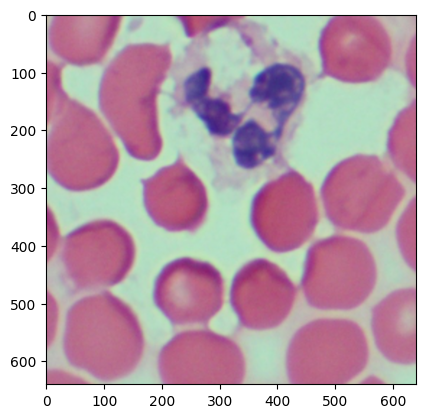

In [ ]:
dum=cv2.imread(r'/content/yolo/train/images/image-1.png')
plt.imshow(dum[:,:,2::-1])

In [ ]:
!python detect.py --weights runs/train/blood_cell/weights/best.pt --source /content/yolo/train/images/image-1.png --name blood_cell2 --project runs/detect

detect: weights=['runs/train/blood_cell/weights/best.pt'], source=/content/yolo/train/images/image-1.png, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=blood_cell2, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolo/train/images/image-1.png: 640x640 24 rbcs, 1 wbc, 458.8ms
Speed: 9.0ms pre-process, 458.8ms inference, 1.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/blood_cell2


In [ ]:
!mkdir -p tmp
!cp runs/train/blood_cell/test_batch0_labels.jpg tmp/0.jpg
!cp runs/train/blood_cell/test_batch0_pred.jpg tmp/1.jpg
!ffmpeg -r 1 -i tmp/%d.jpg -r 1 -y tmp/out.gif

cp: cannot stat 'runs/train/blood_cell/test_batch0_labels.jpg': No such file or directory
cp: cannot stat 'runs/train/blood_cell/test_batch0_pred.jpg': No such file or directory
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable

In [ ]:
!ls -l runs/detect/blood_cell2

total 476
-rw-r--r-- 1 root root 484388 Nov 10 17:35 image-1.png


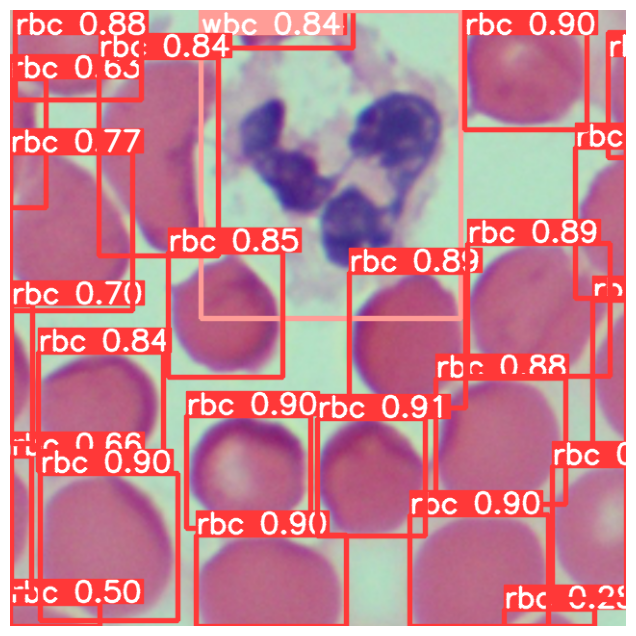

In [ ]:
img = cv2.imread("runs/detect/blood_cell2/image-1.png")
plt.figure(figsize=(8,8))
plt.imshow(img[:,:,2::-1])
plt.axis("off");

In [ ]:
import os

# Specify the file path
image_path = "runs/detect/blood_cell2/image-1.png"

# Check if the image file exists
if os.path.exists(image_path):
    print("Image file exists.")
else:
    print("Image file does not exist.")

Image file exists.


In [ ]:
import os
# %cd yolov5
os.listdir('/content/yolov5')

['data',
 'benchmarks.py',
 'CONTRIBUTING.md',
 'hubconf.py',
 'utils',
 'train.py',
 'tutorial.ipynb',
 'setup.cfg',
 'CITATION.cff',
 '.dockerignore',
 'tmp',
 '.gitattributes',
 'LICENSE',
 'requirements.txt',
 '.gitignore',
 '.git',
 'models',
 '.pre-commit-config.yaml',
 'val.py',
 'export.py',
 '.github',
 'weights',
 'segment',
 'detect.py',
 'README.md',
 'classify',
 'README.zh-CN.md',
 'runs',
 'wandb',
 '__pycache__']

In [ ]:
import torch

model = torch.hub.load('/content/yolov5', 'custom', path='runs/train/blood_cell/weights/best.pt', source='local')
# Images
imgs = ['/content/yolo/test/images/image-21.png']  # batch of images

# Inference
results = model(imgs)

# Results
results.print()
results.save()  # or .show()

results.xyxy[0]  # img1 predictions (tensor)
results.pandas().xyxy[0]

YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.10.12 torch-2.1.0+cu118 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
image 1/1: 640x640 25 rbcs, 1 wbc
Speed: 32.0ms pre-process, 458.0ms inference, 1.8ms NMS per image at shape (1, 3, 640, 640)
Saved 1 image to runs/detect/exp


,xmin,ymin,xmax,ymax,confidence,class,name
0,480.391846,0.000000,630.300537,123.172684,0.901530,0,rbc
1,243.523087,482.758667,384.106445,603.129639,0.897754,0,rbc
2,87.327164,64.958847,214.966385,189.465530,0.896889,0,rbc
3,0.000000,265.710999,82.961929,409.616272,0.893365,0,rbc
4,215.313675,172.263916,470.688782,443.433960,0.886557,1,wbc
5,376.399536,524.897400,519.017639,639.502380,0.886299,0,rbc
6,41.770821,142.645203,180.298004,278.414612,0.883195,0,rbc
7,522.060852,572.879944,639.895447,640.000000,0.875102,0,rbc
8,358.954407,36.557190,479.016296,170.960556,0.868737,0,rbc
9,0.000000,104.230301,80.429657,251.074692,0.855064,0,rbc


In [ ]:
!ls -l runs/detect/blood_cell2

total 476
-rw-r--r-- 1 root root 484388 Nov 10 17:35 image-1.png


In [ ]:
import pandas as pd
# result1=pd.DataFrame(results)
results2=results.pandas().xyxy[0]
print("Total No. of Blood Cells in the image: ", len(results2[results2['name']=='wbc']) +  len(results2[(results2['name'] == 'rbc') & (results2['confidence'] > 0.7)]))
print("No.Of WBC's in the image is: ",len(results2[results2['name']=='wbc']))
print("No.Of RBC's in the image is: ",len(results2[(results2['name'] == 'rbc') & (results2['confidence'] > 0.7)]))
# img= cv2.imread("runs/detect/exp/image-1.png")


Total No. of Blood Cells in the image:  19
No.Of WBC's in the image is:  1
No.Of RBC's in the image is:  18


In [ ]:
results3 = results2[((results2['name'] == 'rbc') & (results2['confidence'] > 0.7)) | (results2['name'] == 'wbc')]

In [ ]:
import os

# Specify the file path
image_path = "runs/detect/blood_cell2/image-1.png"

# Check if the image file exists
if os.path.exists(image_path):
    print("Image file exists.")
else:
    print("Image file does not exist.")

Image file exists.


In [ ]:
img = cv2.imread("runs/detect/blood_cell2/image-1.png")
plt.figure(figsize=(8, 8))
plt.imshow(img[:,:,2::-1])  # Convert BGR to RGB
plt.axis("off")
plt.show()  # Explicitly show the plot

In [ ]:
%matplotlib inline

In [ ]:
results3

,xmin,ymin,xmax,ymax,confidence,class,name
0,480.391846,0.000000,630.300537,123.172684,0.901530,0,rbc
1,243.523087,482.758667,384.106445,603.129639,0.897754,0,rbc
2,87.327164,64.958847,214.966385,189.465530,0.896889,0,rbc
3,0.000000,265.710999,82.961929,409.616272,0.893365,0,rbc
4,215.313675,172.263916,470.688782,443.433960,0.886557,1,wbc
5,376.399536,524.897400,519.017639,639.502380,0.886299,0,rbc
6,41.770821,142.645203,180.298004,278.414612,0.883195,0,rbc
7,522.060852,572.879944,639.895447,640.000000,0.875102,0,rbc
8,358.954407,36.557190,479.016296,170.960556,0.868737,0,rbc
9,0.000000,104.230301,80.429657,251.074692,0.855064,0,rbc


Total No. of Blood Cells in the image:  19
No.Of WBC's in the image is:  1
No.Of RBC's in the image is:  18


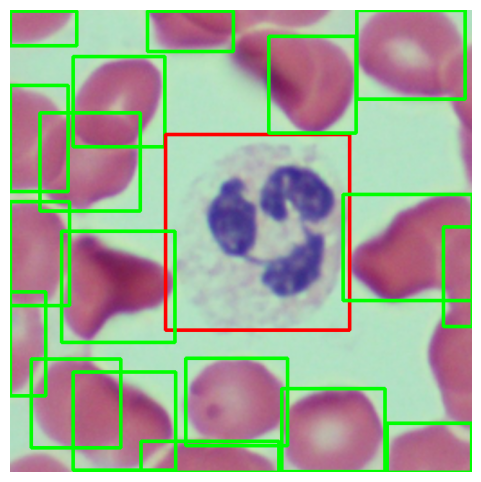

In [ ]:
img=cv2.imread("/content/yolo/test/images/image-21.png")

for _, row in results3.iterrows():
    xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
    if row["name"] == 'wbc':
        color = (0, 0, 255)  # Red color for 'wbc' label
    elif row["name"] == 'rbc':
        color = (0, 255, 0)  # Green color for 'rbc' label
    else:
        continue

    # Draw bounding box with floating-point coordinates
    cv2.rectangle(img, (int(xmin), int(ymin)), (int(xmax), int(ymax)), color, 4)

# Display the image with bounding boxes
if img is not None:
    # Convert the image to RGB format (OpenCV loads images in BGR format)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Display the image using plt.imshow()
    results2=results.pandas().xyxy[0]
    print("Total No. of Blood Cells in the image: ", len(results2[results2['name']=='wbc']) +  len(results2[(results2['name'] == 'rbc') & (results2['confidence'] > 0.7)]))
    print("No.Of WBC's in the image is: ",len(results2[results2['name']=='wbc']))
    print("No.Of RBC's in the image is: ",len(results2[(results2['name'] == 'rbc') & (results2['confidence'] > 0.7)]))
    plt.figure(figsize=(6, 6))
    plt.imshow(img_rgb)
    plt.axis('off')
    # plt.show()
else:
    print("Error: Failed to load the image.")


In [ ]:
results2.to_csv('output.txt', sep='\t', index=True)